### Notebook to format improved cell compartments and annotations of final object for production

- **Developed by:** Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology & Julius-Maximilian-Universität Würzburg**
- **Created on**: 230811
- **Last modified**: 240507

### Import required modules

In [1]:
import anndata
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.7
scanpy      1.10.1
-----
PIL                 10.3.0
appnope             0.1.4
asttokens           NA
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0.post0
debugpy             1.8.1
decorator           5.1.1
executing           2.0.1
h5py                3.11.0
ipykernel           6.29.4
ipywidgets          8.1.2
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
legacy_api_wrap     NA
llvmlite            0.42.0
matplotlib          3.8.4
mpl_toolkits        NA
natsort             8.4.0
numba               0.59.1
numpy               1.26.4
packaging           24.0
pandas              2.2.2
parso               0.8.4
platformdirs        4.2.1
prompt_toolkit      3.0.43
psutil              5.9.8
pure_eval           0.2.2
pydev_ipython       NA
pydevconsole        NA
pydevd              2.9.5
pydevd_file_utils   NA
pydevd_plugins      NA
pydevd_tracing      NA
pygments            2.18.0


In [3]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis = 0).astype(int), adata.X.sum(axis = 0))

### Read in individual cell compartment objects

In [4]:
epi_copd_all = sc.read_h5ad('../data/Marburg_cell_states_scANVI_ctl240508.raw.h5ad')
epi_copd_all

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'seed_labels', 'batch-scANVI'
    var: 'mt', 'ribo'
    obsm: 'X_scANVI', 'X_umap'

### Normalise cell states labels

In [5]:
adata = epi_copd_all.copy()
adata

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'seed_labels', 'batch-scANVI'
    var: 'mt', 'ribo'
    obsm: 'X_scANVI', 'X_umap'

In [6]:
adata.obs['cell_states'] = adata.obs['cell_states'].astype('category')
adata.obs['cell_states'].cat.categories

Index(['APOD+Ciliated', 'CCDC3+Basal1', 'DHRS9+Club', 'FB-like_Basal',
       'IGFBP6+Basal', 'IGFBP+Basal', 'ImmuneClub', 'Ionocyte',
       'KRT14+AQP1+Secretory', 'KRT14+Goblet', 'KRT16+SupraB', 'KRT17+Goblet',
       'MHCII+Club', 'MKI67+pBasal', 'MUC5B+Goblet', 'NOTCH3+SupraB',
       'NOTCH+Basal2', 'OASiav_Ciliated', 'OMG+Ciliated', 'RARRES1+lip_Goblet',
       'S100A2+Basal', 'SCGB1+KRT5-FOXA1+iav_Club', 'SCGB1A1+Deutero',
       'SCGB1A1+Goblet', 'SERPINE1+Basal', 'SERPINE2+Basal', 'TCN1+Club',
       'TNC+Basal', 'iav-lip_Club', 'iavAPC_Epi', 'iav_Goblet', 'ifn_Basal',
       'ifn_Goblet', 'mixed_Goblet1', 'mixed_Goblet2', 'p53_Ciliated'],
      dtype='object')

### Create a column for cell-compartment

In [9]:
trans_from = [['APOD+Ciliated', 'OASiav_Ciliated', 'OMG+Ciliated', 'p53_Ciliated'],
['CCDC3+Basal1', 'FB-like_Basal', 'IGFBP6+Basal', 'IGFBP+Basal', 'MKI67+pBasal', 'NOTCH+Basal2', 'S100A2+Basal', 'SERPINE2+Basal', 'SERPINE1+Basal', 'TNC+Basal', 'ifn_Basal'],
['DHRS9+Club', 'ImmuneClub', 'MHCII+Club', 'SCGB1+KRT5-FOXA1+iav_Club', 'TCN1+Club', 'iav-lip_Club'], 
['KRT14+Goblet', 'KRT17+Goblet', 'MUC5B+Goblet', 'RARRES1+lip_Goblet', 'SCGB1A1+Goblet', 'iav_Goblet', 'ifn_Goblet'],
['KRT16+SupraB', 'NOTCH3+SupraB'],
['Ionocyte'],
['iavAPC_Epi'],
['SCGB1A1+Deutero'],
['KRT14+AQP1+Secretory'],
['mixed_Goblet1', 'mixed_Goblet2']]

trans_to = ['Ciliated', 'Basal', 'Club', 'Goblet', 'SupraB', 'Ionocyte', 'Epi', 'Deuterosomal', 'Secretory', 'Mixed']

adata.obs['cell_compartment'] = [str(i) for i in adata.obs['cell_states']]
for leiden,celltype in zip(trans_from, trans_to):
    for leiden_from in leiden:
        adata.obs['cell_compartment'][adata.obs['cell_compartment'] == leiden_from] = celltype

/var/folders/lg/x_40326938n7b_ybcxybstf00000gn/T/ipykernel_4660/3257067207.py:17: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.obs['cell_compartment'][adata.obs['cell_compartment'] == leiden_from] = celltype
/var/folders/lg/x_40326938

In [10]:
adata.obs['cell_compartment'] = adata.obs['cell_compartment'].astype('category')
adata.obs['cell_compartment'].cat.categories

Index(['Basal', 'Ciliated', 'Club', 'Deuterosomal', 'Epi', 'Goblet',
       'Ionocyte', 'Mixed', 'Secretory', 'SupraB'],
      dtype='object')

### Export object

In [11]:
X_is_raw(adata)

True

In [12]:
adata

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'seed_labels', 'batch-scANVI'
    var: 'mt', 'ribo'
    obsm: 'X_scANVI', 'X_umap'

### Visualise manifold with cell states and cell compartments

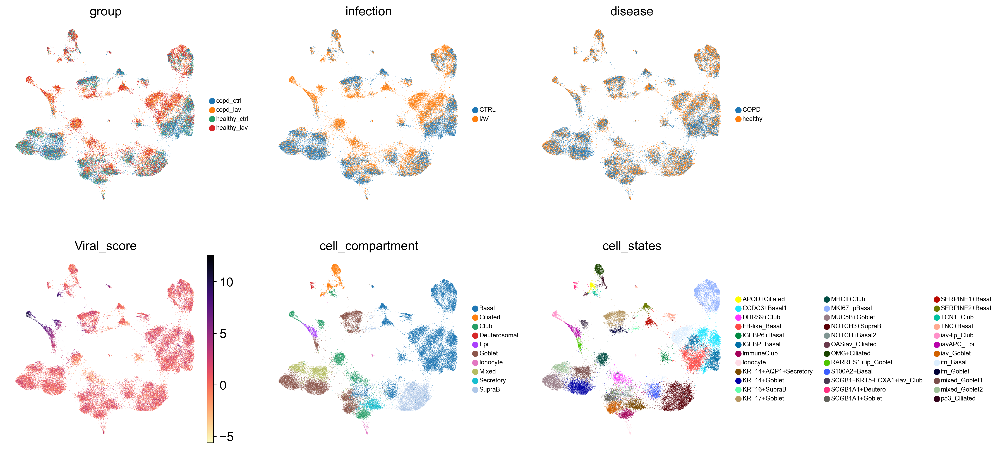

In [13]:
sc.pl.umap(adata,
           color = ['group', 'infection', 'disease', 'Viral_score', 'cell_compartment', 'cell_states'],
           size = 0.4,
           frameon = False,
           legend_fontsize = 7,
           ncols = 3)

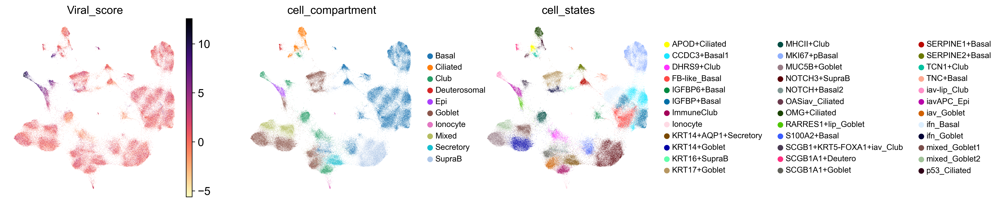

In [17]:
sc.pl.umap(adata,
           color = ['Viral_score', 'cell_compartment', 'cell_states'],
           size = 0.3,
           frameon = False,
           legend_fontsize = 10,
           ncols = 3)

In [18]:
adata.write('../data/Marburg_cell_states_locked_ctl240504.raw.h5ad')